In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader 
from torch.autograd import Variable
from torch.backends import cudnn


import matplotlib.pyplot as plt
import os
from PIL import Image
import cv2
import numpy as np


# Augmenting library 

import torchvision
import torchvision.transforms.functional as TF
import albumentations as A
import torchvision.transforms as T

# Control Randomness
import random
random_seed = 7
torch.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(random_seed)
random.seed(random_seed)

import warnings
warnings.filterwarnings("ignore")
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
print(torch.cuda.device_count())


# logging
import datetime
from tensorboardX import SummaryWriter
from tqdm import tqdm
import time 

/home/sklab2/anaconda3/envs/vessel2/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2


In [2]:
import joint_transforms
from config import cod_training_root
from config import backbone_path
from datasets import ImageFolder
from misc import AvgMeter, check_mkdir
from PFNet import PFNet
from helper import *
import loss

# Config

In [3]:
ckpt_path = './ckpt'
exp_name = 'PFNet'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args = {
    'epoch_num': 200,
    'train_batch_size': 32,
    'last_epoch': 0,
    'lr': 1e-4, 
    'lr_decay': 0.9,
    'weight_decay': 1e-4,
    'momentum': 0.9,
    'snapshot': '',
    'scale': 416, 
    'save_point': [],
    'poly_train': False,
    'optimizer': 'Adam',
    'amp' : False
}

In [4]:
def dice_loss(pred, target, smooth = 1.):
    pred = pred.contiguous()
    target = target.contiguous()
    intersection = (pred * target).sum(dim=2).sum(dim=2)
    loss = (1 -   ( (2. * intersection + smooth) / (pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) + smooth))  )
    return loss.mean()


def soft_dice_loss(inputs, targets):
        num = targets.size(0)
        m1  = inputs.view(num,-1)
        m2  = targets.view(num,-1)
        intersection = (m1 * m2)
        score = 2. * (intersection.sum(1)+1) / (m1.sum(1) + m2.sum(1)+1)
        score = 1 - score.sum()/num
        return score

# Net

In [5]:
import torch
import torch.nn as nn

def double_conv(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, 3, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, 3, padding=1),
        nn.ReLU(inplace=True))   


class UNet(nn.Module):

    def __init__(self, n_classes):
        super().__init__()
                
        self.dconv_down1 = double_conv(1, 64)
        self.dconv_down2 = double_conv(64, 128)
        self.dconv_down3 = double_conv(128, 256)
        self.dconv_down4 = double_conv(256, 512)        

        self.maxpool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)        
        
        self.dconv_up3 = double_conv(256 + 512, 256)
        self.dconv_up2 = double_conv(128 + 256, 128)
        self.dconv_up1 = double_conv(128 + 64, 64)
        
        self.conv_last = nn.Conv2d(64, n_classes,1)#,1
        
        
    def forward(self, x):
        conv1 = self.dconv_down1(x)
        x = self.maxpool(conv1)
 
        conv2 = self.dconv_down2(x)
        x = self.maxpool(conv2)
 
        conv3 = self.dconv_down3(x)
        x = self.maxpool(conv3)   
 
        x = self.dconv_down4(x)
        
        x = self.upsample(x)        
 
        #import pdb
        #pdb.set_trace() 
        
        x = torch.cat([x, conv3], dim=1)
        
        x = self.dconv_up3(x)
        x = self.upsample(x)        
        x = torch.cat([x, conv2], dim=1)       

        x = self.dconv_up2(x)
        x = self.upsample(x)        
        x = torch.cat([x, conv1], dim=1)   
        
        x = self.dconv_up1(x)
        
        out = self.conv_last(x)
        out = torch.sigmoid(out)
        
        return out
 

In [6]:
net = UNet(n_classes=1)
optimizer = torch.optim.Adam(net.parameters(), lr=args['lr'])
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50, eta_min=0)

## making data index list

In [7]:
mask_files = os.walk("/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/masked")
mask_idx = []
for (root, dirs, files) in mask_files:
    if len(files) > 0 :
        mask_idx.append(files)

mask_idxs = [element for array in mask_idx for element in array]
len(mask_idxs)

1691

In [8]:
# 1~ 11 / 12, 13, 14  , 40, 41, 43, 44, 46, 49,  50, 53, 54, 55 
train_indexs = []
test_indexs = []
for idx, data in enumerate(mask_idxs):
    tmp = mask_idxs[idx].split('_')
    if len(tmp) < 3:
        if int(tmp[0]) < 45:
            train_indexs.append([ tmp[0], tmp[1].split('.')[0]])
        else:
            test_indexs.append([tmp[0], tmp[1].split('.')[0]])

In [9]:
len(train_indexs) , len(test_indexs)

(1319, 355)

# Dataloader

In [10]:
import albumentations.augmentations.functional as AF

PATH = '/home/sklab2/workspace/datashared/SS-OCT/vessel_segmentation/'
class VesselDataset(Dataset):
    def __init__(self, index, transforms):
        self.index = index
        self.transforms = transforms
        
    def __len__(self):
        return len(self.index)
        
    def __getitem__(self, idx):
        s_1 = self.index[idx][0]
        s_2 = self.index[idx][1]

        # '1_L_0.jpg', 
        image = Image.open(PATH+'origin/' + s_1+'_L_'+s_2+'.jpg').convert("L").resize((416, 416),Image.Resampling.BILINEAR)
        #'10_L_112_L.png', 
        mask = Image.open(PATH+'masked/' +  s_1+'_'+s_2+'.png').resize((416, 416),Image.Resampling.BILINEAR)
        
        image = np.array(image, dtype=np.uint8) #RGB
        mask = np.array(mask, dtype=np.uint8)   # HWC
        mask_o = mask / 255        # CHW

        lower_red = np.array([-10, 100, 100]) 
        upper_red = np.array([10, 255, 255]) 

        mask_hsv = cv2.cvtColor(mask, cv2.COLOR_RGB2HSV)
        mask = cv2.inRange(mask_hsv, lower_red, upper_red)

        aft_mask = mask / 255

        # img_min = np.min(image)
        # img_max = np.max(image)
        
        # image = (image - img_min) / (img_max - img_min)
        
        # aft_mask = cv2.resize(aft_mask, (416, 416), interpolation=cv2.INTER_NEAREST)
        masks = [aft_mask, mask_o]  # target, original

        # for num in range(3): #### 3번 이터레이션이 왜들어갔지?
        if self.transforms:
            transformed = self.transforms(image=image, masks=masks)
            image, masks = transformed['image'], transformed['masks']
        # urls.append(s_1+'_'+s_2)
        assert sum(masks[0]==0).sum() + sum(masks[0]==1).sum() == 416*416   # mask가 0 또는 1이 아닐경우 스탑
                    
        return image, masks, aft_mask, s_1+'_'+s_2

In [11]:
import albumentations.pytorch as AP

# def get_mean_std(dataset):
#     meanRGB = [np.mean(image.numpy(), axis=(1, 2)) for image, _, _, _ in dataset]
#     stdRGB = [np.std(image.numpy(), axis=(1, 2)) for image, _, _, _ in dataset]

#     meanR = np.mean([m[0] for m in meanRGB])
#     meanG = np.mean([m[1] for m in meanRGB])
#     meanB = np.mean([m[2] for m in meanRGB])

#     stdR = np.mean([s[0] for s in stdRGB])
#     stdG = np.mean([s[1] for s in stdRGB])
#     stdB = np.mean([s[2] for s in stdRGB])

#     print(meanR, meanG, meanB)
#     print(stdR, stdG, stdB)

#     return meanRGB, stdRGB

def get_mean_std(dataset):
    mean_ = [np.mean(image.numpy(), axis=(1, 2)) for image, _, _, _ in dataset]
    std_ = [np.std(image.numpy(), axis=(1, 2)) for image, _, _, _ in dataset]

    mean = np.mean(mean_)
    std = np.mean(std_)

    print(mean, std)

    return mean, std

train_transform = A.Compose([
    # A.Resize(416, 416, interpolation=cv2.INTER_NEAREST),
    # A.RandomRotate90(p=prob),
    # A.HorizontalFlip(p=prob),
    # A.OneOf([
    #     A.OpticalDistortion(p=1, distort_limit=0.1, interpolation=cv2.INTER_NEAREST),
    #     A.GridDistortion(p=1, interpolation=cv2.INTER_NEAREST),
    #     A.ElasticTransform(p=1, interpolation=cv2.INTER_NEAREST),
    #     ], p = prob),
    # A.RandomBrightnessContrast(p=prob),    # 밝기 및 조도 변화
    # A.Normalize(mean=(126.71482973095203, 126.6879562017254, 126.85466873988524), std = (31.31187149184309, 31.37091519475967, 31.28646507868047)),
    AP.ToTensorV2(always_apply=True)
])

test_transform = A.Compose([
    AP.ToTensorV2(always_apply=True)
])

# tensor([127.5388, 127.5482, 127.6733])
# tensor([57.4250, 57.6999, 57.5387])
train_dataset = VesselDataset(index=train_indexs, transforms=train_transform)
test_dataset = VesselDataset(index=test_indexs, transforms=test_transform)
 
#train_dataset, _, test_dataset = torch.utils.data.random_split(dataset, [train, 0, test])

train_loader = DataLoader(dataset=train_dataset, batch_size=args['train_batch_size'], shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

image, masks, aft_mask, _= next(iter(train_loader))
print(image.shape, masks[0].shape, masks[1].shape, aft_mask.shape)

torch.Size([32, 1, 416, 416]) torch.Size([32, 416, 416]) torch.Size([32, 416, 416, 3]) torch.Size([32, 416, 416])


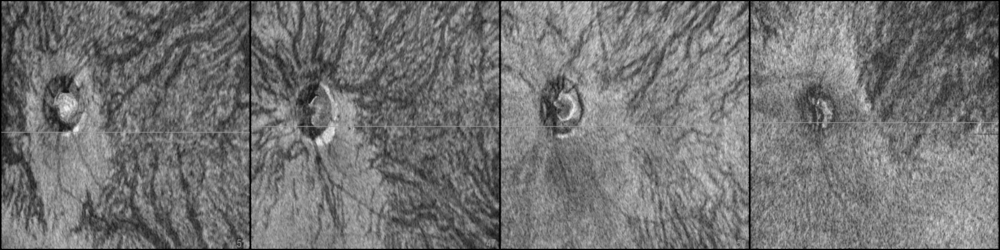

In [12]:
TF.to_pil_image(torchvision.utils.make_grid(image[:4]))

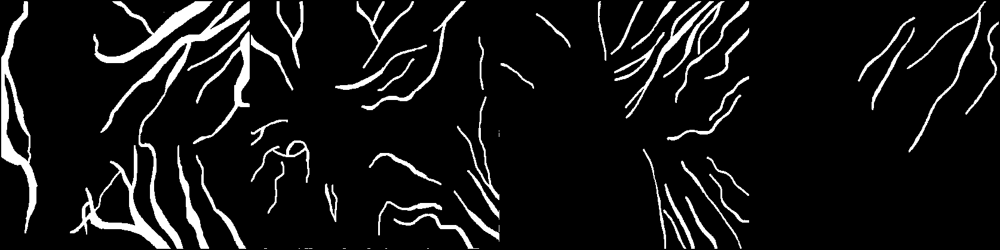

In [13]:
TF.to_pil_image(torchvision.utils.make_grid(aft_mask[:4].unsqueeze(1).expand(4, 3, 416, 416)))

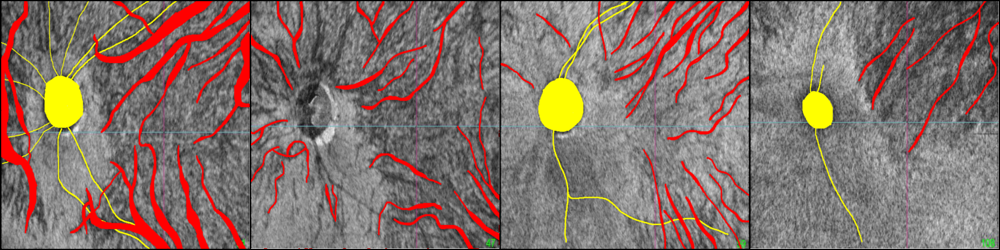

In [14]:
TF.to_pil_image(torchvision.utils.make_grid(masks[1][:4].permute(0, 3, 1, 2)))

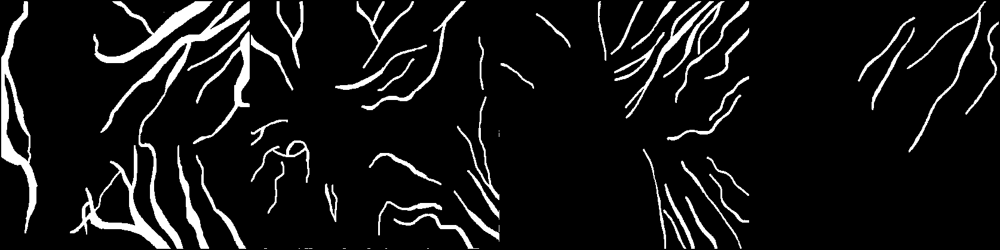

In [15]:
TF.to_pil_image(torchvision.utils.make_grid(masks[0][:4].unsqueeze(1).expand(4, 3, 416, 416)))

In [16]:
# meanRGB, stdRGB = get_mean_std(train_dataset)

In [17]:
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score
def calc_metric(labels, preds):
    accuracy = np.mean(np.equal(labels,preds))
    right = np.sum(labels *preds == 1)
    precision = right / np.sum(preds)
    recall = right / np.sum(labels)
    f1 = 2 * precision*recall/(precision+recall)

    
    y_pred = preds
    y_true = labels
    """ Ground truth """
    #y_true = y_true.cpu().numpy()
    y_true = y_true > 0.5
    y_true = y_true.astype(np.uint8)
    y_true = y_true.reshape(-1)

    """ Prediction """
    #y_pred = y_pred.cpu().numpy()
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.uint8)
    y_pred = y_pred.reshape(-1)

    score_jaccard = jaccard_score(y_true, y_pred)
    score_f1 = f1_score(y_true, y_pred)
    score_recall = recall_score(y_true, y_pred)
    score_precision = precision_score(y_true, y_pred)
    score_acc = accuracy_score(y_true, y_pred)
    print('jaccard, f1, recall, precision, acc')
    print(score_jaccard, score_f1, score_recall, score_precision, score_acc)
    return score_jaccard, score_f1, score_recall, score_precision, score_acc

# Train

Using 2 GPUs.
Unet_b32_e200_js_220930_18:00
../model/vessel_Unet_b32_e200_220930_18:00.pt
Training 200 epochs.


100%|██████████| 42/42 [02:02<00:00,  2.91s/it, Epoch=0, Loss=0.659614, Mean Loss=0.730059, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.29463004708418317 0.4551571280888476 0.4774513673446144 0.4348520332995006 0.8961018398668639
Model Saved


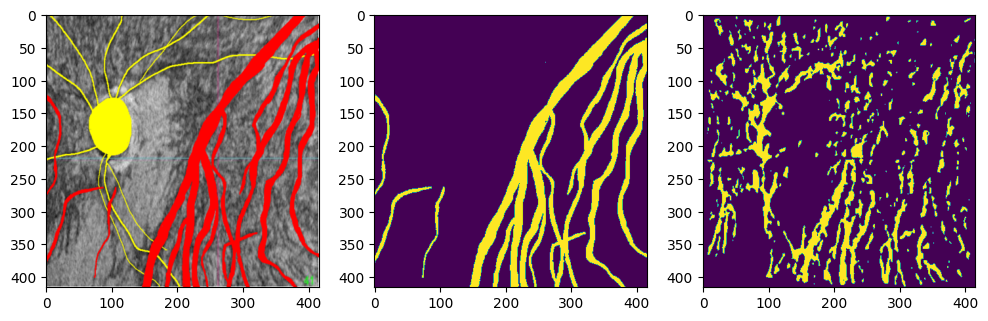

100%|██████████| 42/42 [01:57<00:00,  2.80s/it, Epoch=10, Loss=0.596530, Mean Loss=0.502458, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3857471183059965 0.556735227099086 0.5937460378631645 0.5240677702483122 0.9140622395616301
Model Saved


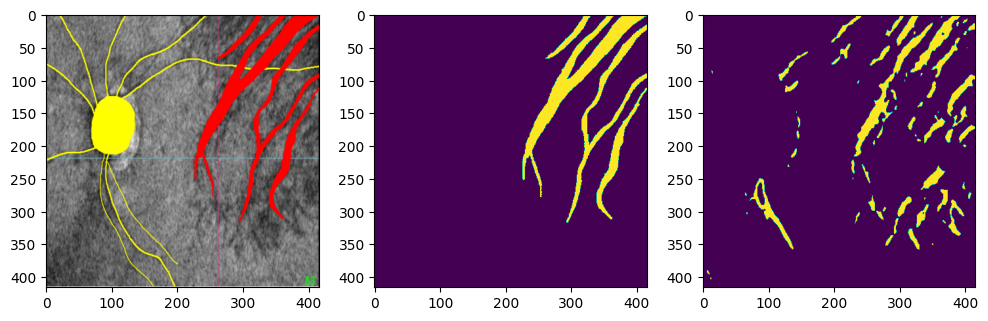

100%|██████████| 42/42 [02:00<00:00,  2.87s/it, Epoch=20, Loss=0.397319, Mean Loss=0.411948, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4067798659589065 0.578313460125664 0.5482316960918378 0.6118880839338516 0.9273292956704725
Model Saved


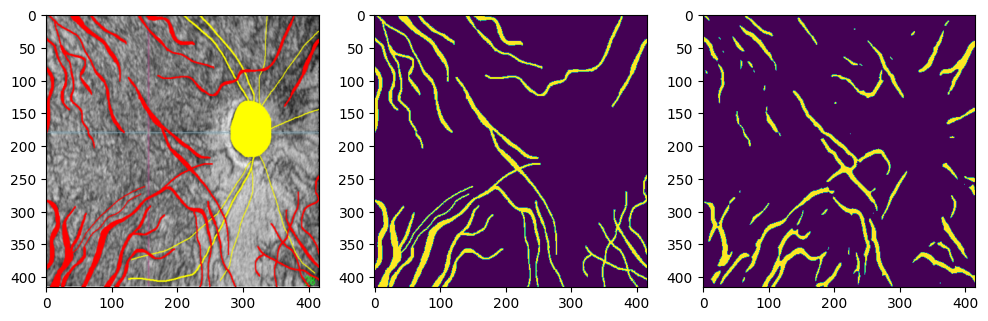

100%|██████████| 42/42 [01:56<00:00,  2.77s/it, Epoch=30, Loss=0.294179, Mean Loss=0.344315, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.4131985078463202 0.5847706540194761 0.535747159617973 0.6436695794923873 0.9308437975300025
Model Saved


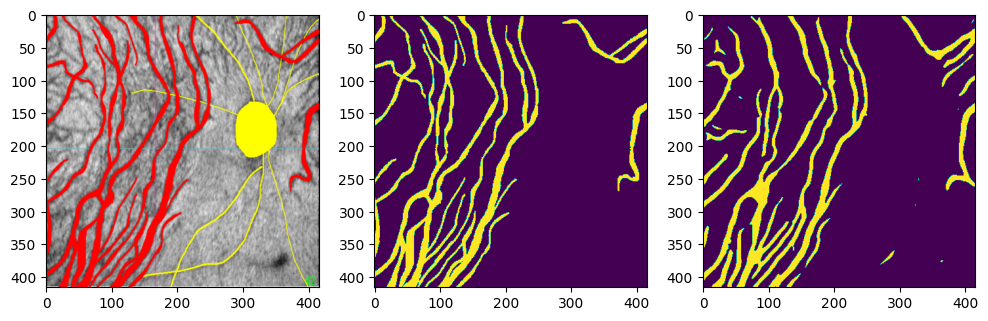

100%|██████████| 42/42 [01:57<00:00,  2.79s/it, Epoch=40, Loss=0.303202, Mean Loss=0.298002, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3816649746602119 0.5524710862039091 0.47477466410033614 0.660573274069615 0.9300854009969581


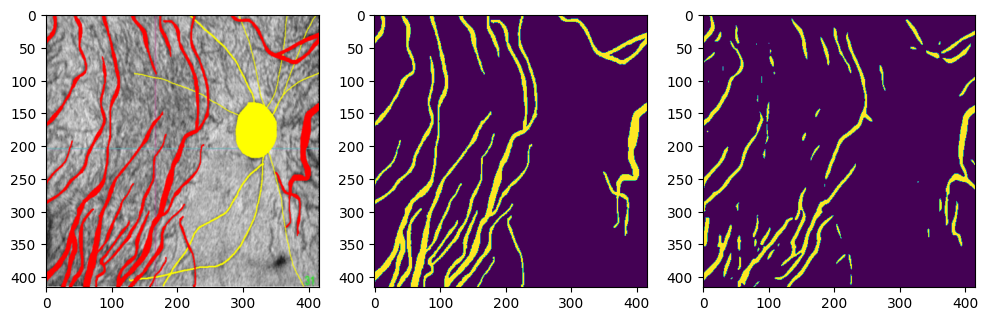

100%|██████████| 42/42 [01:54<00:00,  2.72s/it, Epoch=50, Loss=0.262936, Mean Loss=0.269540, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.41081217145940585 0.5823768461459242 0.5716637285668543 0.5934991651270957 0.9254770742613968


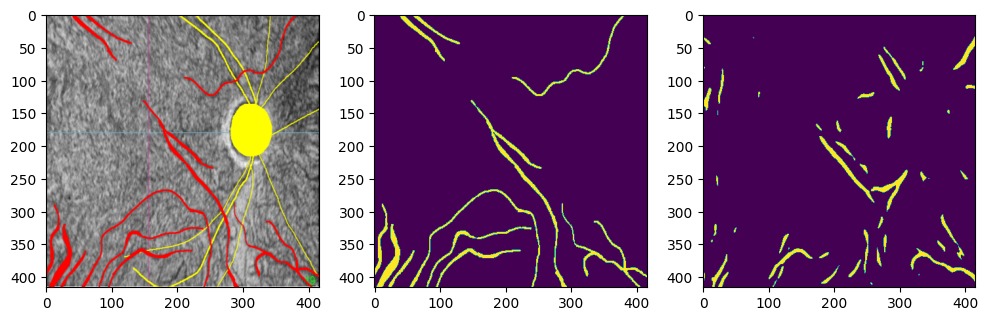

100%|██████████| 42/42 [01:55<00:00,  2.75s/it, Epoch=60, Loss=0.217976, Mean Loss=0.241428, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3705587387489226 0.5407411273553691 0.4508476555252871 0.6754094578389211 0.9303907812630219


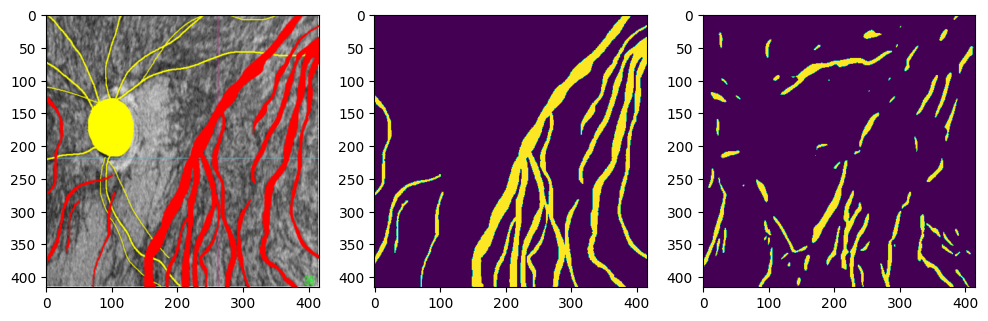

100%|██████████| 42/42 [01:56<00:00,  2.78s/it, Epoch=70, Loss=0.152327, Mean Loss=0.227866, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3591223361535992 0.5284621208859502 0.43521704809434203 0.6725572295158184 0.9294044360467539


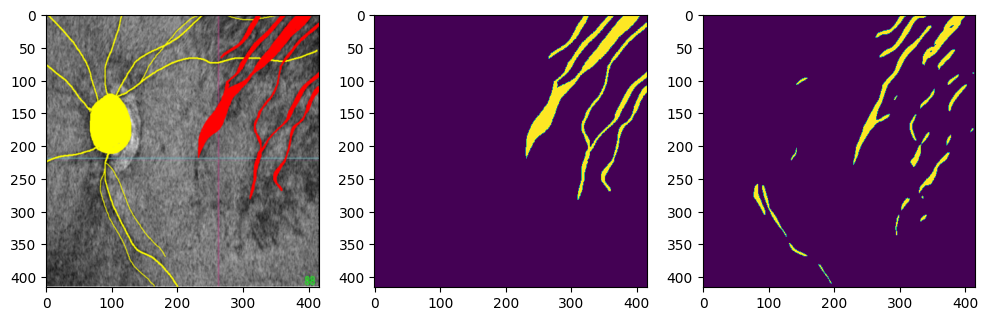

100%|██████████| 42/42 [01:54<00:00,  2.72s/it, Epoch=80, Loss=0.221632, Mean Loss=0.208736, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3594740151975556 0.5288427894597422 0.4445687655038191 0.6525407088808695 0.9279975968049421


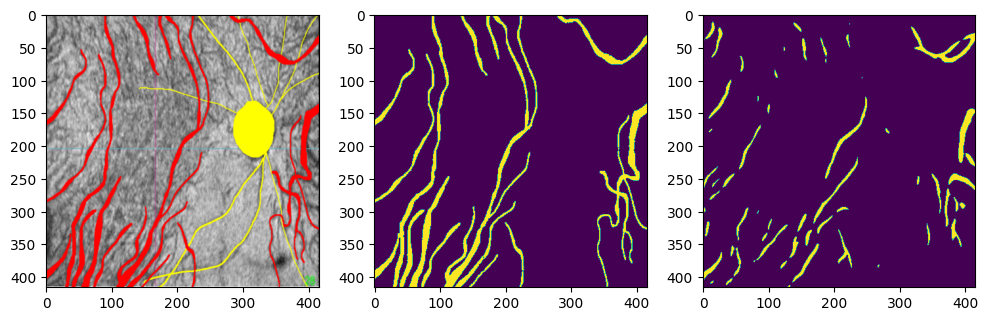

100%|██████████| 42/42 [01:55<00:00,  2.74s/it, Epoch=90, Loss=0.233002, Mean Loss=0.194502, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3768497425183874 0.547408669052142 0.503639614420065 0.5995093296225027 0.9243022042201433


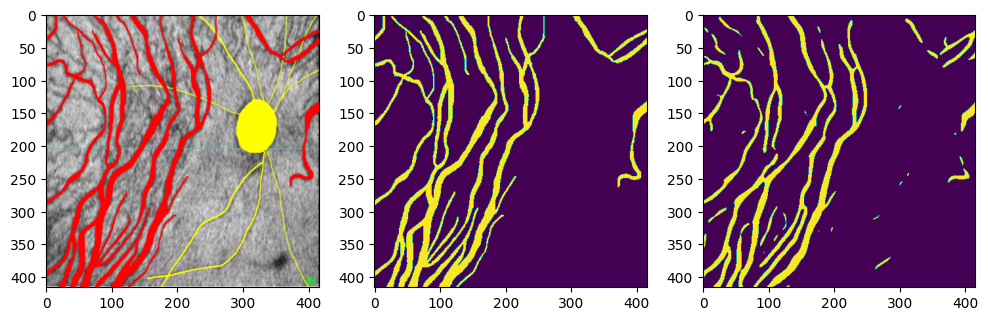

100%|██████████| 42/42 [02:07<00:00,  3.04s/it, Epoch=100, Loss=0.161285, Mean Loss=0.184476, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.36527166556858925 0.5350900846777128 0.46534271901617946 0.6294317484040292 0.9265006296097591


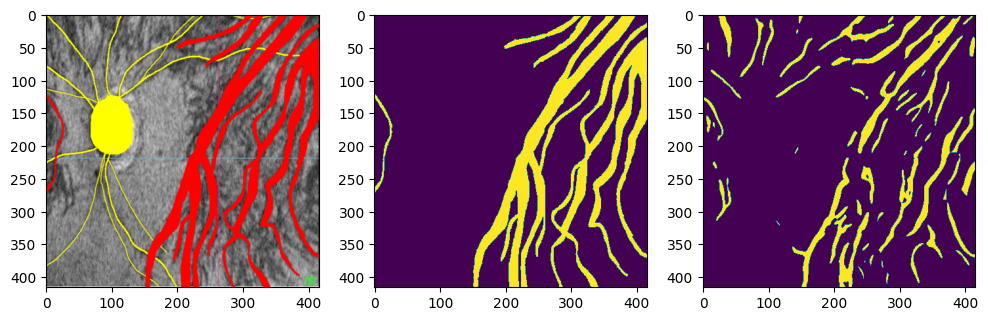

100%|██████████| 42/42 [01:57<00:00,  2.80s/it, Epoch=110, Loss=0.191471, Mean Loss=0.166934, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3591138511701522 0.5284529340363459 0.4569508684287625 0.6264827529991421 0.9258763100050004


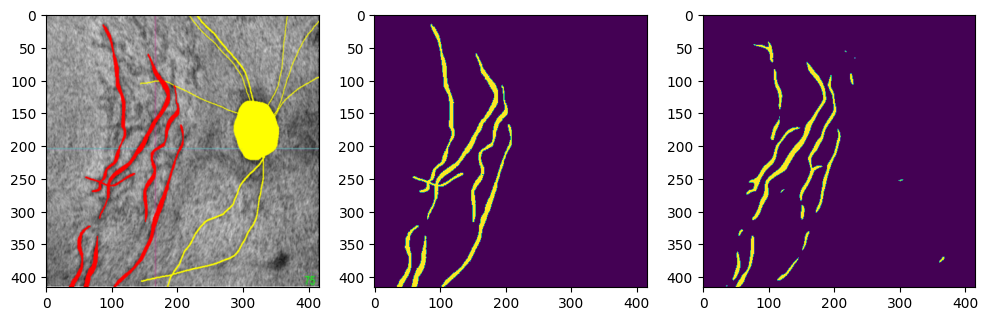

100%|██████████| 42/42 [01:58<00:00,  2.83s/it, Epoch=120, Loss=0.135875, Mean Loss=0.157974, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3592014371020067 0.5285477594371453 0.46465165072022246 0.6128189461318102 0.9246558144168264


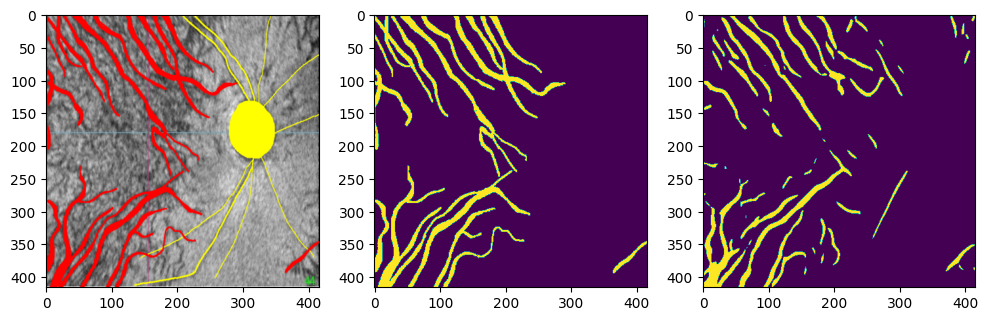

100%|██████████| 42/42 [01:55<00:00,  2.75s/it, Epoch=130, Loss=0.146401, Mean Loss=0.152036, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3462865486511062 0.5144321600747825 0.43421850007199003 0.630996912055786 0.9254926842861905


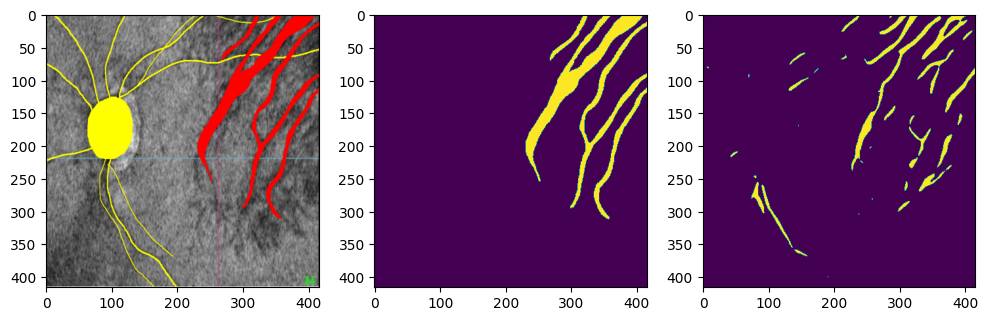

100%|██████████| 42/42 [01:49<00:00,  2.60s/it, Epoch=140, Loss=0.154066, Mean Loss=0.143944, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3459349059950588 0.514044036534303 0.4384800580504532 0.6210748756275063 0.924644452792941


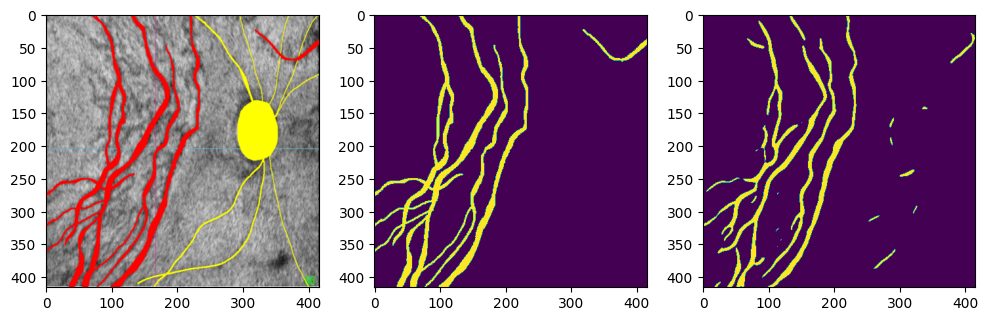

100%|██████████| 42/42 [01:55<00:00,  2.75s/it, Epoch=150, Loss=0.107742, Mean Loss=0.133923, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3271968300106881 0.49306451403753443 0.39493792025512403 0.6560729202613135 0.9261846690349196


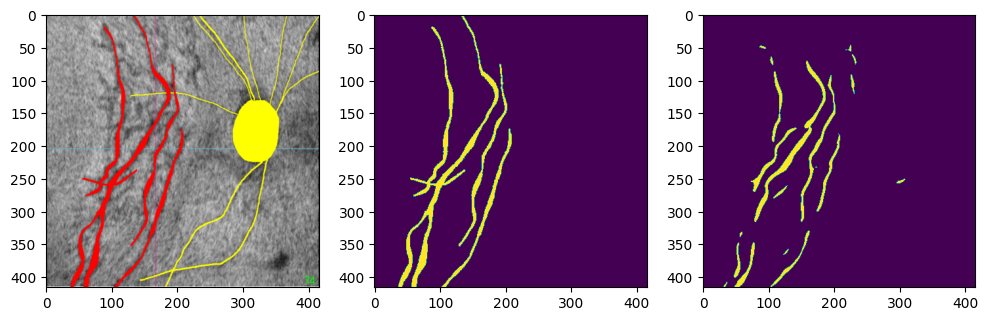

100%|██████████| 42/42 [01:58<00:00,  2.82s/it, Epoch=160, Loss=0.123445, Mean Loss=0.128992, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3384284215581164 0.5057101539492694 0.42102445010017714 0.6330413663301822 0.9251906083319443


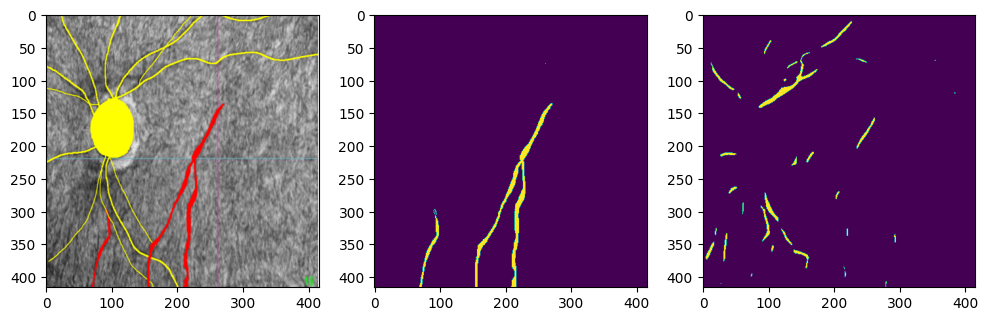

100%|██████████| 42/42 [01:50<00:00,  2.62s/it, Epoch=170, Loss=0.142322, Mean Loss=0.124993, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.34279004537283914 0.5105638763916515 0.44095010340057894 0.6062783941426474 0.9231570241530545


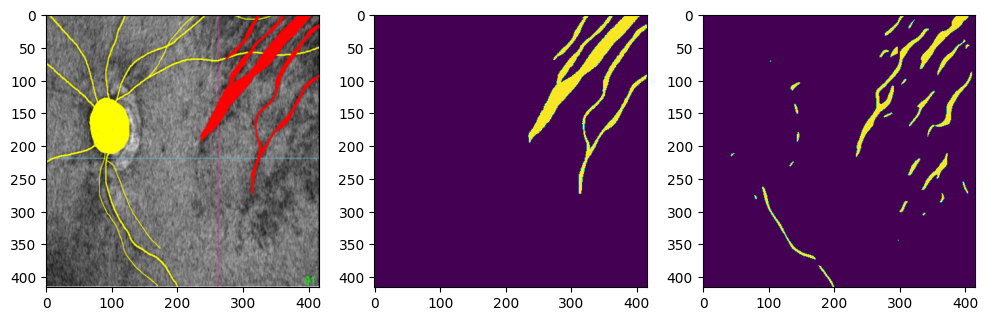

100%|██████████| 42/42 [01:53<00:00,  2.71s/it, Epoch=180, Loss=0.135002, Mean Loss=0.118867, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3360548234903033 0.5030554399143522 0.4243503170067628 0.6176036555520051 0.9237946586694724


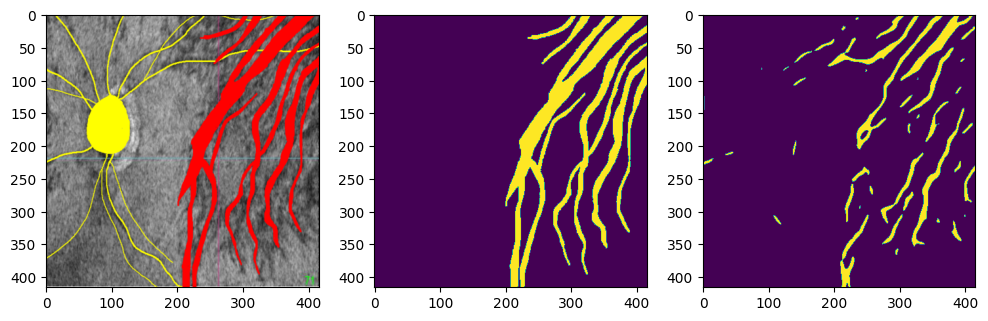

100%|██████████| 42/42 [01:58<00:00,  2.82s/it, Epoch=190, Loss=0.106853, Mean Loss=0.114370, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.34229931936340763 0.5100193592078178 0.43703918333957725 0.612259110916542 0.9236724316870156


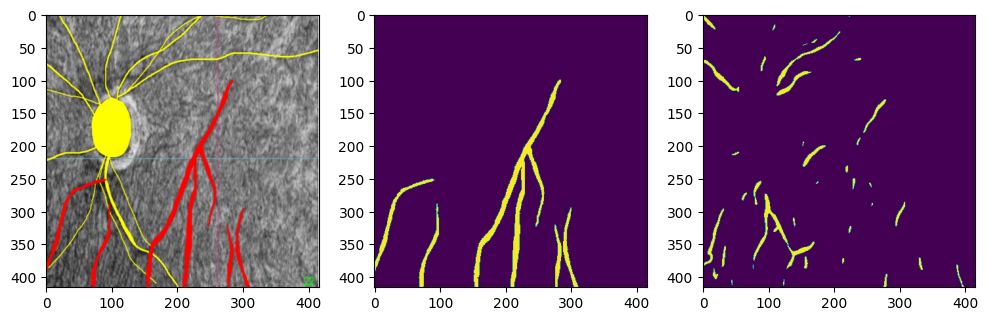

100%|██████████| 42/42 [01:49<00:00,  2.61s/it, Epoch=199, Loss=0.109449, Mean Loss=0.116949, lr=0.000100]


Testing...
jaccard, f1, recall, precision, acc
0.3336741606118311 0.5003833327006292 0.4166215982928697 0.6263011148163075 0.9243786103269023


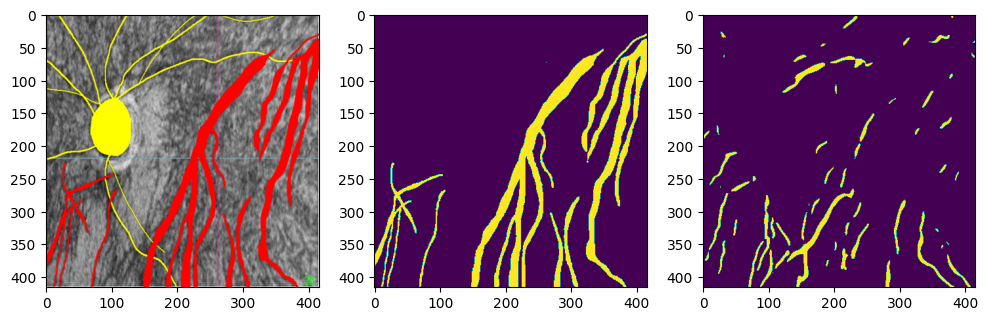

In [18]:
from tensorboardX import SummaryWriter
import datetime 

exp = 'Unet'

num_epochs = args['epoch_num']
resume_epochs = args['last_epoch']
load_from = '../model/vessel_PFNet_base_b32_e500_220921_00:30.pt'


batch_size = args['train_batch_size']
scaler = torch.cuda.amp.GradScaler()
now = datetime.datetime.now()
log_name = f'{exp}_b{batch_size}_e{num_epochs}_js_'+now.strftime("%y%m%d_%H:%M")
writer = SummaryWriter(log_dir='./ckpt/PFNet/log/'+ log_name)
save_path = f'../model/vessel_{exp}_b{batch_size}_e{num_epochs}_'+ now.strftime("%y%m%d_%H:%M") + '.pt'


print(f'Using {torch.cuda.device_count()} GPUs.')
net = nn.DataParallel(net)

# net.float()
net = net.to(device)
train_loss_list = []
test_acc_list = []
test_recall_list = []
test_f1_list = []
test_iou_list = []
print(log_name)
print(save_path)
print(f'Training {num_epochs} epochs.')
if resume_epochs != 0:
    print(f'Resuming from epoch {resume_epochs}')
    net.load_state_dict(torch.load(load_from))
if args['amp'] == True:
    print("Using mixed precision.")

# print(data.shape, aug_masks[0].shape, aug_masks[1].shape, aft_mask.shape)
curr_iter = 1

for epoch in range(args['last_epoch'], args['last_epoch'] + args['epoch_num']):
    
    net.train()

    loss_running = 0
    tqdm_dataset = tqdm(train_loader)
    for batch_idx, batch in enumerate(tqdm_dataset):
        if args['poly_train']:
            base_lr = args['lr'] * (1 - float(curr_iter) / float(num_epochs)) ** args['lr_decay']
            optimizer.param_groups[0]['lr'] = 2 * base_lr
            optimizer.param_groups[1]['lr'] = 1 * base_lr

        image, masks, aft_mask, _ = batch

        labels = masks[0]
        labels = labels.unsqueeze(1)
        image, labels = image.float().to(device), labels.float().to(device)
        optimizer.zero_grad()
        

        outputs = net(image)
        loss = dice_loss(outputs, labels)
        
        loss.backward()
        # nn.utils.clip_grad_norm_(net.parameters(), max_norm=10)
        optimizer.step()
        
        loss_running += loss.item()
        
        tqdm_dataset.set_postfix({
            'Epoch': epoch,
            'Loss': '{:06f}'.format(loss.item()),
            'Mean Loss' : '{:06f}'.format(loss_running/(batch_idx+1)),
            'lr' : '{:06f}'.format(optimizer.param_groups[0]["lr"])
        })

        curr_iter += 1

    epoch_loss = loss_running / len(train_loader)
    # scheduler.step()

    writer.add_scalar('loss/Train', epoch_loss, epoch)
    writer.add_scalar('learning_rate', optimizer.param_groups[0]["lr"], epoch)
    train_loss_list.append(epoch_loss)

## EVAL
    if epoch % 10 == 0 or epoch == args['epoch_num']-1 :
        print("Testing...")

        images=[]
        preds=[]
        labels=[]
        label_os = []
        urls_list = []
        net.eval()
        # tqdm_loader = tqdm(test_loader)
        with torch.no_grad():
            for idx, dd in enumerate(test_loader):

                image, masks, mask_o, urls = dd 
                
                image = image.float().to(device)
                label = masks[0].float()
                label_o = masks[1].float()
                pred = net(image)    

                images.append(image.cpu().detach().numpy())
                labels.append(label.numpy())
                label_os.append(label_o)
                preds.append(pred.cpu().detach().numpy())
                urls_list.append(urls)

            images= np.array(images).squeeze(1)
            preds = np.array(preds).squeeze(1)
            labels = np.array(labels)
            label_os = np.array(label_os)
            preds = np.where(preds > 0.5 , 1 , 0)
            labels = np.where(labels > 0.5 , 1 , 0)
            
            score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)
            test_acc_list.append(score_acc)
            test_recall_list.append(score_recall)
            test_f1_list.append(score_f1)
            test_iou_list.append(score_jaccard)
            writer.add_scalar('Accuracy/Test', score_acc, epoch)
            writer.add_scalar('F1/Test', score_f1, epoch)
            writer.add_scalar('Recall/Test', score_recall, epoch)
            writer.add_scalar('Precision/Test', score_precision, epoch)
            writer.add_scalar('Jaccard/Test', score_jaccard, epoch)

            if np.max(test_iou_list) == test_iou_list[-1] or np.max(test_f1_list) == test_f1_list[-1]:
                torch.save(net.state_dict(), save_path)
                print("Model Saved")

            randnum = np.random.randint(0, 171)
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 3, 1)  
            plt.imshow(label_os[randnum][0])
            plt.subplot(1, 3, 2)  
            plt.imshow(labels[randnum][0])
            plt.subplot(1, 3, 3)
            plt.imshow(preds[randnum][0])
            plt.tight_layout()
            plt.show()

# evaluation

In [21]:
print("Testing...")
net = UNet(n_classes=1)
load_from = '/home/sklab2/workspace/code_only/junsu/model/vessel_Unet_b32_e200_220930_18:00.pt'
if torch.cuda.device_count() > 1:
    print(f'Using {torch.cuda.device_count()} GPUs.')
net = nn.DataParallel(net)
net.load_state_dict(torch.load(load_from))
net.to(device)

images=[]
preds=[]
labels=[]
label_os = []
urls_list = []
net.eval()
# tqdm_loader = tqdm(test_loader)
with torch.no_grad():
    for idx, dd in enumerate(tqdm(test_loader)):

        image, masks, mask_o, urls = dd 
        
        image = image.float().to(device)
        label = masks[0].float()
        label_o = masks[1].float()
        pred = net(image)    

        images.append(image.cpu().detach().numpy())
        labels.append(label.numpy())
        label_os.append(label_o)
        preds.append(pred.cpu().detach().numpy())
        urls_list.append(urls)

    images= np.array(images).squeeze(1)
    preds = np.array(preds).squeeze(1)
    labels = np.array(labels)
    label_os = np.array(label_os)
    preds = np.where(preds > 0.5 , 1 , 0)
    labels = np.where(labels > 0.5 , 1 , 0)
    
    score_jaccard, score_f1, score_recall, score_precision, score_acc = calc_metric(labels=labels, preds=preds)

Testing...
Using 2 GPUs.


100%|██████████| 355/355 [00:24<00:00, 14.22it/s]


jaccard, f1, recall, precision, acc
0.4131985078463202 0.5847706540194761 0.535747159617973 0.6436695794923873 0.9308437975300025


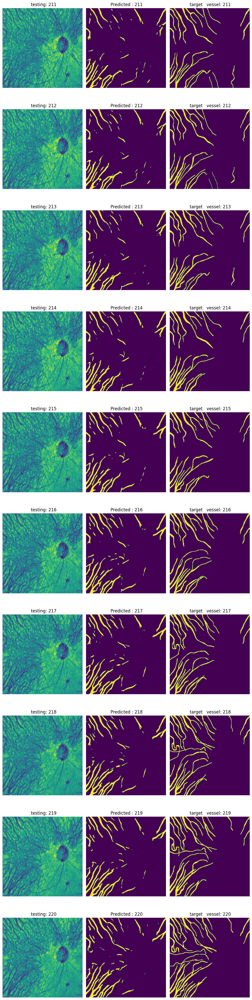

In [22]:
# randnum = np.random.randint(0, len(test_dataset)-10)
randnum=211

fig, axes = plt.subplots(10, 3, figsize = (10,40))
[c_ax.axis('off') for c_ax in axes.flatten()]

for idx, (img_ax, target_ax , mask_ax ) in zip(range(randnum, randnum+10), axes):
    
# inputs[:10] , preds[:10], targets[:10], urls_list[:10]) :
    
    image = images[idx].astype(int).transpose(1, 2, 0) # astype(int)
    img_target = preds[idx].transpose(1, 2, 0) 
    img_mask = labels[idx].transpose(1, 2, 0)  
 
    img_ax.imshow(np.clip(image, 0, 255))

    target_ax.imshow(img_target )
    mask_ax.imshow(img_mask)

    img_ax.set_title(f'  testing: {idx}')
    target_ax.set_title(f' Predicted : {idx}')
    
    mask_ax.set_title(f' target   vessel: {idx}')
plt.tight_layout()
plt.show()
 